In [1]:
from diffusers import DiffusionPipeline


In [7]:
pipeline = DiffusionPipeline.from_pretrained("stable-diffusion-v1-5/stable-diffusion-v1-5")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [8]:
pipeline.to('mps')

StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.33.1",
  "_name_or_path": "stable-diffusion-v1-5/stable-diffusion-v1-5",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "PNDMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

  0%|          | 0/50 [00:00<?, ?it/s]

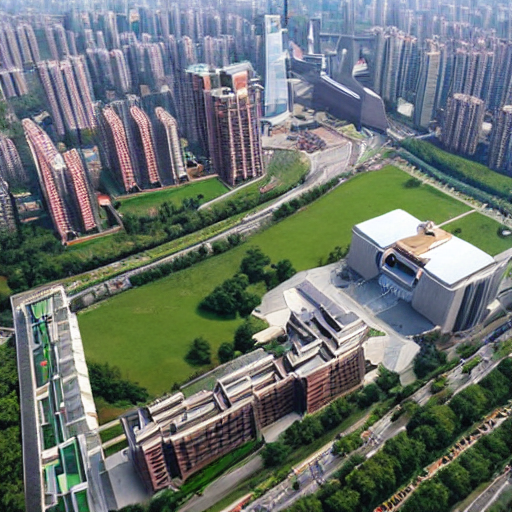

In [9]:
image = pipeline("Tongji University in Shanghai").images[0]
image

In [10]:
image.save("Tongji University in Shanghai_2.png")

In [15]:
from diffusers import EulerDiscreteScheduler
from diffusers import StableDiffusionPipeline

In [16]:
pipeline = StableDiffusionPipeline.from_pretrained("stable-diffusion-v1-5/stable-diffusion-v1-5")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [17]:
pipeline.scheduler = EulerDiscreteScheduler.from_config(pipeline.scheduler.config)

In [18]:
pipeline.to('mps')

StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.33.1",
  "_name_or_path": "stable-diffusion-v1-5/stable-diffusion-v1-5",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "EulerDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [19]:
image = pipeline("Tongji University in Shanghai").images[0]
image
image.save("Tongji University in Shanghai_3.png")

  0%|          | 0/50 [00:00<?, ?it/s]

In [23]:
from diffusers import UNet2DModel

In [24]:
repo_id = "google/ddpm-cat-256"

In [27]:
model = UNet2DModel.from_pretrained(repo_id)

diffusion_pytorch_model.safetensors:   0%|          | 0.00/455M [00:00<?, ?B/s]

In [28]:
model.config

FrozenDict([('sample_size', 256),
            ('in_channels', 3),
            ('out_channels', 3),
            ('center_input_sample', False),
            ('time_embedding_type', 'positional'),
            ('time_embedding_dim', None),
            ('freq_shift', 1),
            ('flip_sin_to_cos', False),
            ('down_block_types',
             ['DownBlock2D',
              'DownBlock2D',
              'DownBlock2D',
              'DownBlock2D',
              'AttnDownBlock2D',
              'DownBlock2D']),
            ('mid_block_type', 'UNetMidBlock2D'),
            ('up_block_types',
             ['UpBlock2D',
              'AttnUpBlock2D',
              'UpBlock2D',
              'UpBlock2D',
              'UpBlock2D',
              'UpBlock2D']),
            ('block_out_channels', [128, 128, 256, 256, 512, 512]),
            ('layers_per_block', 2),
            ('mid_block_scale_factor', 1),
            ('downsample_padding', 0),
            ('downsample_type', 'conv'),
   

In [30]:
import torch

torch.manual_seed(0) # 设置随机种子

noisy_sample = torch.randn(1, model.config.in_channels, model.config.sample_size, model.config.sample_size) # 生成噪声
noisy_sample.shape

torch.Size([1, 3, 256, 256])

In [31]:
with torch.no_grad():
    noisy_residual = model(sample=noisy_sample, timestep=2).sample

In [32]:
from diffusers import DDPMScheduler

In [33]:
scheduler = DDPMScheduler.from_config(repo_id)

/opt/anaconda3/envs/diffusers/lib/python3.9/site-packages/diffusers/configuration_utils.py:248: FutureWarning: It is deprecated to pass a pretrained model name or path to `from_config`.If you were trying to load a scheduler, please use <class 'diffusers.schedulers.scheduling_ddpm.DDPMScheduler'>.from_pretrained(...) instead. Otherwise, please make sure to pass a configuration dictionary instead. This functionality will be removed in v1.0.0.
  deprecate("config-passed-as-path", "1.0.0", deprecation_message, standard_warn=False)


scheduler_config.json:   0%|          | 0.00/256 [00:00<?, ?B/s]

In [34]:
scheduler

DDPMScheduler {
  "_class_name": "DDPMScheduler",
  "_diffusers_version": "0.33.1",
  "beta_end": 0.02,
  "beta_schedule": "linear",
  "beta_start": 0.0001,
  "clip_sample": true,
  "clip_sample_range": 1.0,
  "dynamic_thresholding_ratio": 0.995,
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "rescale_betas_zero_snr": false,
  "sample_max_value": 1.0,
  "steps_offset": 0,
  "thresholding": false,
  "timestep_spacing": "leading",
  "trained_betas": null,
  "variance_type": "fixed_small"
}

In [35]:
less_noisy_sample = scheduler.step(model_output=noisy_residual, timestep=2, sample=noisy_sample).prev_sample
less_noisy_sample.shape

torch.Size([1, 3, 256, 256])

In [36]:
import PIL.Image
import numpy as np


def display_sample(sample, i):
    image_processed = sample.cpu().permute(0, 2, 3, 1)
    image_processed = (image_processed + 1.0) * 127.5
    image_processed = image_processed.numpy().astype(np.uint8)

    image_pil = PIL.Image.fromarray(image_processed[0])
    display(f"Image at step {i}")
    display(image_pil)

In [37]:
model.to("mps")
noisy_sample = noisy_sample.to("mps")

  5%|▍         | 49/1000 [00:15<04:17,  3.70it/s]

'Image at step 50'

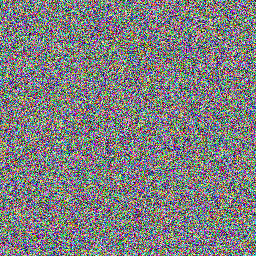

 10%|▉         | 99/1000 [00:29<04:04,  3.69it/s]

'Image at step 100'

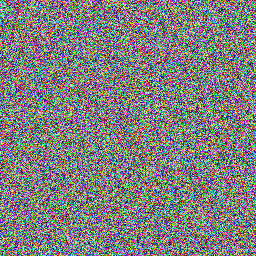

 15%|█▍        | 149/1000 [00:43<03:50,  3.68it/s]

'Image at step 150'

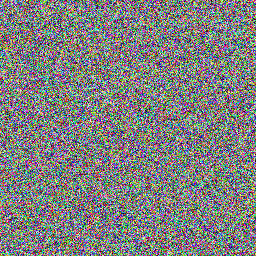

 20%|█▉        | 199/1000 [00:56<03:37,  3.68it/s]

'Image at step 200'

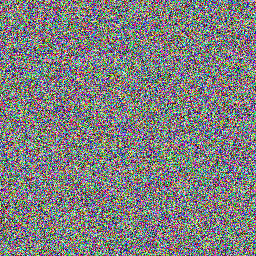

 25%|██▍       | 249/1000 [01:10<03:23,  3.69it/s]

'Image at step 250'

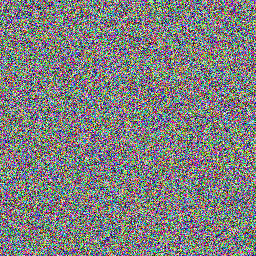

 30%|██▉       | 299/1000 [01:23<03:10,  3.69it/s]

'Image at step 300'

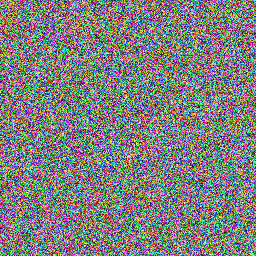

 35%|███▍      | 349/1000 [01:37<02:56,  3.69it/s]

'Image at step 350'

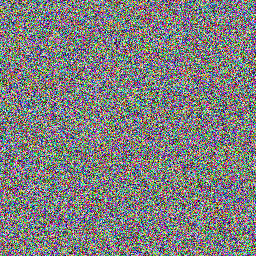

 40%|███▉      | 399/1000 [01:51<02:42,  3.69it/s]

'Image at step 400'

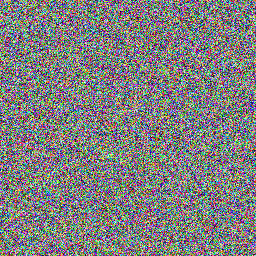

 45%|████▍     | 449/1000 [02:04<02:29,  3.68it/s]

'Image at step 450'

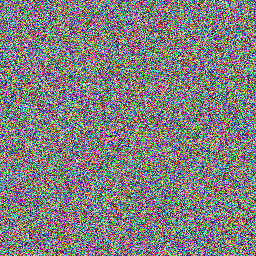

 50%|████▉     | 499/1000 [02:18<02:15,  3.68it/s]

'Image at step 500'

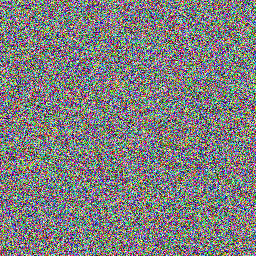

 55%|█████▍    | 549/1000 [02:32<02:02,  3.69it/s]

'Image at step 550'

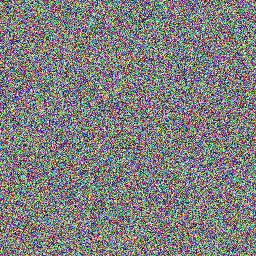

 60%|█████▉    | 599/1000 [02:45<01:51,  3.60it/s]

'Image at step 600'

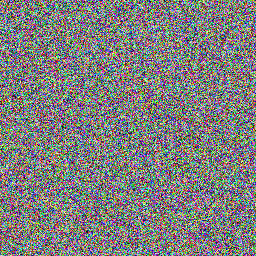

 65%|██████▍   | 649/1000 [02:59<01:37,  3.60it/s]

'Image at step 650'

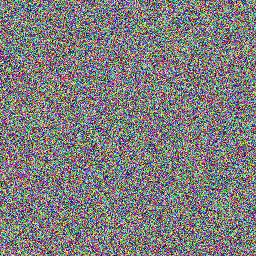

 70%|██████▉   | 699/1000 [03:13<01:25,  3.51it/s]

'Image at step 700'

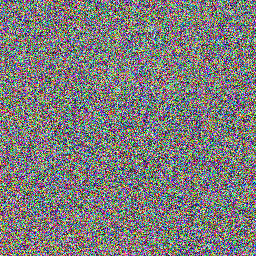

 75%|███████▍  | 749/1000 [03:28<01:17,  3.22it/s]

'Image at step 750'

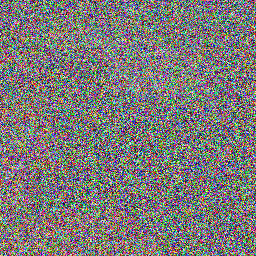

 80%|███████▉  | 799/1000 [03:44<01:06,  3.00it/s]

'Image at step 800'

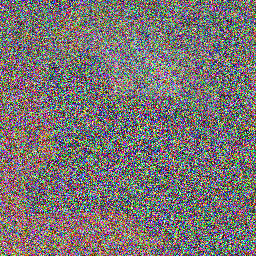

 85%|████████▍ | 849/1000 [04:00<00:47,  3.19it/s]

'Image at step 850'

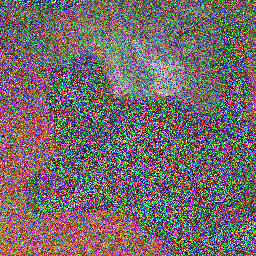

 90%|████████▉ | 899/1000 [04:16<00:31,  3.17it/s]

'Image at step 900'

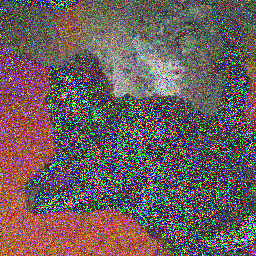

 95%|█████████▍| 949/1000 [04:32<00:16,  3.03it/s]

'Image at step 950'

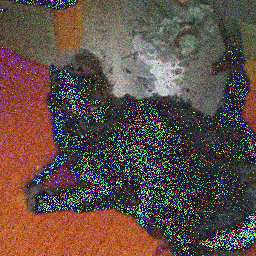

100%|█████████▉| 999/1000 [04:48<00:00,  3.16it/s]

'Image at step 1000'

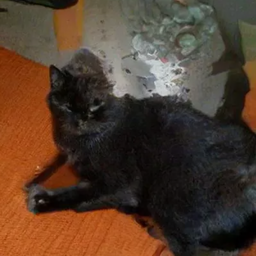

100%|██████████| 1000/1000 [04:48<00:00,  3.46it/s]


In [38]:
import tqdm

sample = noisy_sample

for i, t in enumerate(tqdm.tqdm(scheduler.timesteps)):
    # 1. predict noise residual
    with torch.no_grad():
        residual = model(sample, t).sample

    # 2. compute less noisy image and set x_t -> x_t-1
    sample = scheduler.step(residual, t, sample).prev_sample

    # 3. optionally look at image
    if (i + 1) % 50 == 0:
        display_sample(sample, i + 1)

In [1]:
from diffusers import DiffusionPipeline

model_id = "stable-diffusion-v1-5/stable-diffusion-v1-5"
pipeline = DiffusionPipeline.from_pretrained(model_id, use_safetensors=True)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [2]:
prompt = "A photo of an astronaut riding a horse on mars"

In [3]:
pipeline = pipeline.to("mps")

In [4]:
import torch
generator = torch.Generator("mps").manual_seed(0)

  0%|          | 0/50 [00:00<?, ?it/s]

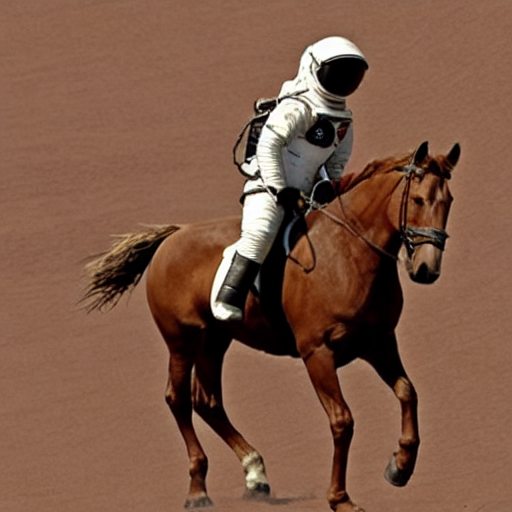

In [5]:
image = pipeline(prompt, generator=generator).images[0]
image

In [1]:
import torch


In [6]:
pipeline = DiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16, use_safetensors=True)
pipeline = pipeline.to("mps")
generator = torch.Generator("mps").manual_seed(0)
image = pipeline(prompt, generator=generator).images[0]
image

NameError: name 'DiffusionPipeline' is not defined

In [2]:
from diffusers import DPMSolverMultistepScheduler

In [3]:
pipeline.scheduler = DPMSolverMultistepScheduler.from_config(pipeline.scheduler.config)

NameError: name 'pipeline' is not defined

  0%|          | 0/20 [00:00<?, ?it/s]

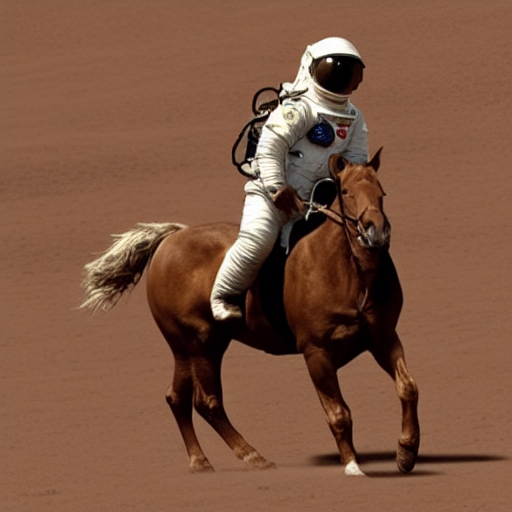

In [11]:
generator = torch.Generator("mps").manual_seed(0)
image = pipeline(prompt, generator=generator, num_inference_steps=20).images[0]
image

In [15]:
def get_inputs(batch_size=1):
    generator = [torch.Generator("mps").manual_seed(i) for i in range(batch_size)]
    prompts = batch_size * [prompt]
    num_inference_steps = 20

    return {"prompt": prompts, "generator": generator, "num_inference_steps": num_inference_steps}

  0%|          | 0/20 [00:00<?, ?it/s]

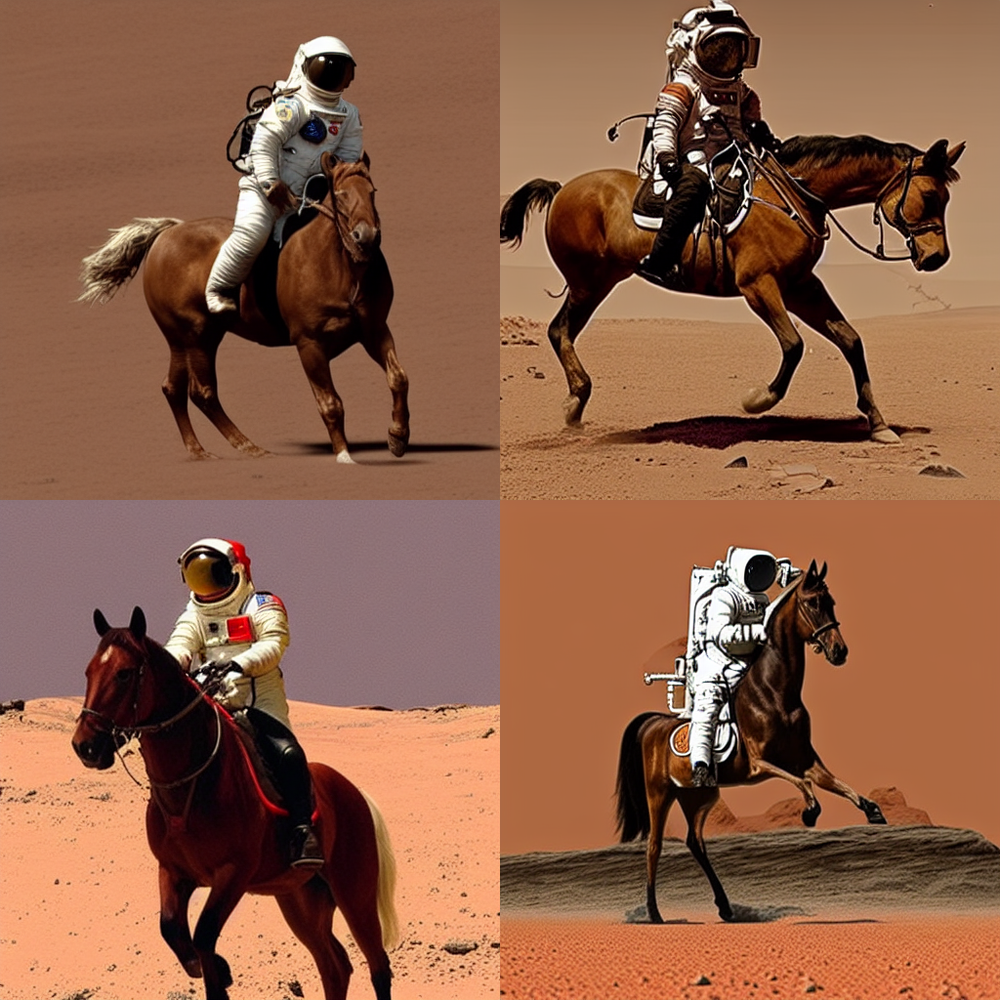

In [16]:
from diffusers.utils import make_image_grid

images = pipeline(**get_inputs(batch_size=4)).images
make_image_grid(images, 2, 2)

In [17]:
pipeline.enable_attention_slicing()

  0%|          | 0/20 [00:00<?, ?it/s]

/opt/anaconda3/envs/diffusers/lib/python3.9/site-packages/diffusers/image_processor.py:147: RuntimeWarning: invalid value encountered in cast
  images = (images * 255).round().astype("uint8")
Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


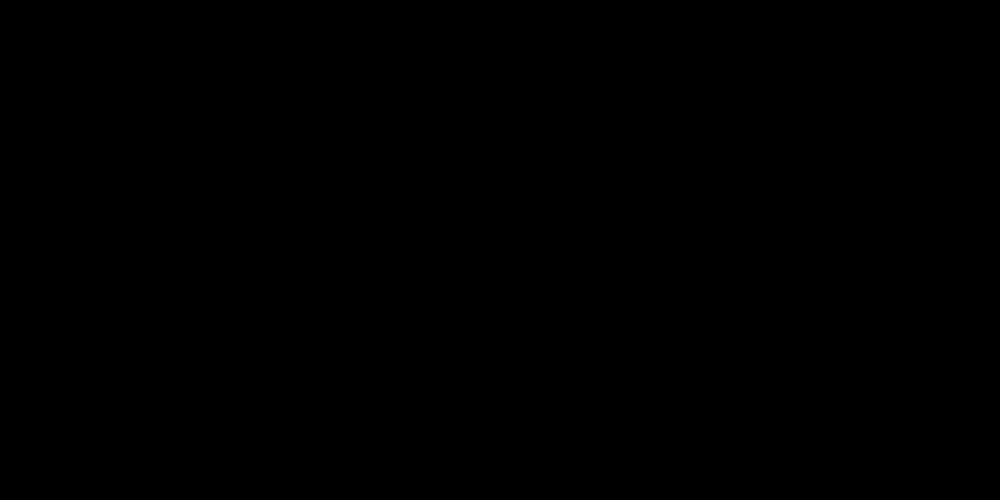

In [18]:
images = pipeline(**get_inputs(batch_size=8)).images
make_image_grid(images, rows=2, cols=4)